In [ ]:
# RetinaNet
'''
RetinaNet utilizes a focal loss function to address class imbalance during training. 
Focal loss applies a modulating term to the cross entropy loss
in order to focus learning on *hard negative examples*.'''

# TODO: build a new train/test split method; design a generalizable test/evaluation scheme to compare different models.

In [1]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0


In [2]:
import torch
print(torch.__version__)

1.12.1+cu113


In [ ]:
#!pip3 install torch torchvision torchaudio --extra-index-url https://download.pytorch.org/whl/cu113

In [3]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-1uyoazaq
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-1uyoazaq
     |████████████████████████████████| 50 kB 4.8 MB/s 
     |████████████████████████████████| 79 kB 9.8 MB/s 
     |████████████████████████████████| 151 kB 94.9 MB/s 
     |████████████████████████████████| 1.4 MB 91.3 MB/s 
     |████████████████████████████████| 509 kB 91.1 MB/s 
     |████████████████████████████████| 248 kB 100.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 843 kB 64.2 MB/s 
     |████████████████████████████████| 96 kB 7.8 MB/s 
     |████████████████████████████████| 117 kB 69.3 MB/s 
  Created whe

In [4]:
!nvidia-smi

Wed Sep 21 19:41:32 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [1]:
from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from tqdm import tqdm

import shutil

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

import os, json, cv2, random
from google.colab.patches import cv2_imshow

import detectron2
from detectron2.utils.logger import setup_logger
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader, MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import ColorMode, Visualizer

In [2]:
%%capture
!gdown 1X3O2v3GIPveq3ylWF6o1qHI5uzbN1vWA
!wget https://raw.githubusercontent.com/pedropro/TACO/master/data/annotations.json

In [ ]:
!rm -rf ./tronTACO
!rm -rf ./output/
!rm -rf ./content

In [3]:
%%capture
!unzip rotated2.zip
%mv /content/content/* /content
%mv ./yoloTACO ./tronTACO

In [4]:
%%capture
anns_path = './annotations.json'
coco = COCO(annotation_file=anns_path)

In [5]:
def anno_getter(img_id,masker=False):
  annotation_ids = coco.getAnnIds(img_id)
  annotations = coco.loadAnns(annotation_ids)
  temp=[]
  for annotation in annotations:
    label = annotation['category_id']
    box = annotation['bbox']
    mask= annotation['segmentation']
    # exclude some annotations that's too small
    # as in yolo models
    if box[2] < 5 or box[3] < 5:
      continue
    if masker==False:
      temp.append([label]+box)
    else:  temp.append(([label],box,mask))
  return temp
  

In [6]:
img_size_list=[]
for id in range(1500):  # Load image
  I = Image.open('tronTACO/images/'+str(id)+'.jpg')
  w,h= I.size
  img_size_list.append([id,w,h])

In [7]:
# minimum annotations per image
np.min([len(anno_getter(i)) for i in range(1500)])

1

In [8]:
%%capture
## train test split

import random
id_list=[i for i in range(1500)]
random.shuffle(id_list)

train_ids = id_list[:1050]
val_ids = id_list[1050:1050+300]
test_ids = id_list[1050+300:]

def move_helper(ids, desti):
  for id in ids:
    img_name = os.path.join( './tronTACO/images', str(id)+'.jpg' )
    lbl_name = os.path.join( './tronTACO/labels', str(id)+'.txt' )
    print(img_name)
    if os.path.isfile(img_name):
        shutil.move( img_name, './tronTACO/images/'+desti)
        shutil.move( lbl_name, './tronTACO/labels/'+desti)
    else :
        print('file does not exist', img_name)

!mkdir tronTACO/images/train
!mkdir tronTACO/images/val
!mkdir tronTACO/images/test
!mkdir tronTACO/labels/train
!mkdir tronTACO/labels/val
!mkdir tronTACO/labels/test
move_helper(test_ids,'test')
move_helper(train_ids,'train')
move_helper(val_ids,'val')

In [9]:
from detectron2.structures import BoxMode

def annotation_reader(id):
  list_dict_=[]
  annotations_for_id = anno_getter(id,masker=True)
      # ([label],box,mask)
  for i in annotations_for_id:
    temp_dict={
        'bbox': i[1],
        'bbox_mode':BoxMode.XYWH_ABS,
        'category_id':i[0][0],
        "segmentation":i[2]}
    list_dict_.append(temp_dict)
  return list_dict_
  
def my_dataset_function(flag):
  train_ids = id_list[:1050]
  val_ids = id_list[1050:1050+300]
  test_ids = id_list[1050+300:]

  if flag=='train':range_=train_ids
  elif flag=='val':range_=val_ids
  elif flag=='test':range_=test_ids
  else: print('Error')
  
  list_dict=[]
  for i in range_:
    temp_dict={'file_name' : 'tronTACO/images/'+flag+'/'+str(i)+'.jpg',
               'height' : img_size_list[i][2],
               'width' : img_size_list[i][1],
               'image_id' : img_size_list[i][0],
               'annotations' : annotation_reader(i)
               }
    list_dict.append(temp_dict)  
  return list_dict

In [10]:
from detectron2.data import DatasetCatalog
# clean the registry
DatasetCatalog.clear()
# register ours
for d in ["train", "val","test"]:
    DatasetCatalog.register("tronTACO_" + d, lambda d=d: my_dataset_function(d))
    MetadataCatalog.get("tronTACO_" + d).set(thing_classes=["Aluminiumfoil","Battery","Aluminiumblisterpack","Cardedblisterpack","Otherplasticbottle","Clearplasticbottle","Glassbottle","Plasticbottlecap","Metalbottlecap","Brokenglass","FoodCan","Aerosol","Drinkcan","Toilettube","Othercarton","Eggcarton","Drinkcarton","Corrugatedcarton","Mealcarton","Pizzabox","Papercup","Disposableplasticcup","Foamcup","Glasscup","Otherplasticcup","Foodwaste","Glassjar","Plasticlid","Metallid","Otherplastic","Magazinepaper","Tissues","Wrappingpaper","Normalpaper","Paperbag","Plastifiedpaperbag","Plasticfilm","Sixpackrings","Garbagebag","Otherplasticwrapper","Single-usecarrierbag","Polypropylenebag","Crisppacket","Spreadtub","Tupperware","Disposablefoodcontainer","Foamfoodcontainer","Otherplasticcontainer","Plasticglooves","Plasticutensils","Poptab","Rope&strings","Scrapmetal","Shoe","Squeezabletube","Plasticstraw","Paperstraw","Styrofoampiece","Unlabeledlitter","Cigarette"
])
metadata_ = MetadataCatalog.get('tronTACO_train')

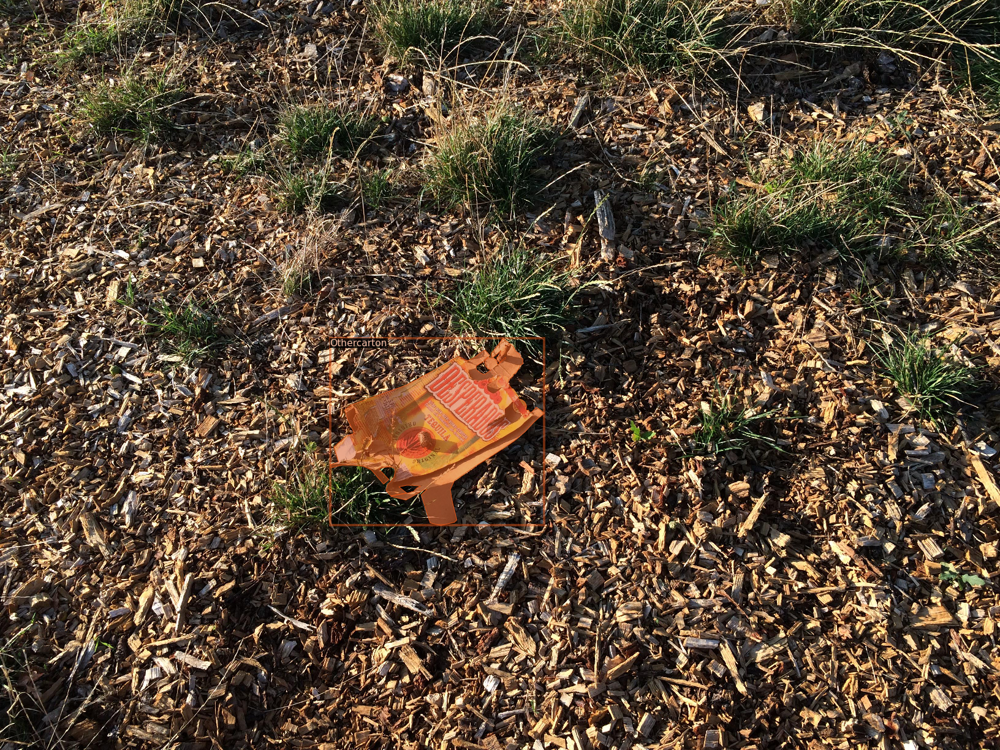

In [11]:
# visual check; if image and bbox are correct
dataset_dicts = my_dataset_function('test')
d=dataset_dicts[1]
img = cv2.imread(d["file_name"])
visualizer = Visualizer(img[:, :, ::-1], metadata=metadata_, scale=0.5)
out = visualizer.draw_dataset_dict(d)
cv2_imshow(out.get_image()[:, :, ::-1])

In [12]:
torch.cuda.empty_cache()

In [13]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("tronTACO_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_101_FPN_3x.yaml")  
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.01  # pick a good LR
cfg.SOLVER.MAX_ITER = 1000 
cfg.SOLVER.STEPS = []       
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 60 

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[09/21 21:26:27 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

  pixel_mean
  pixel_std


[09/21 21:26:30 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[09/21 21:26:52 d2.utils.events]:  eta: 0:16:26  iter: 19  total_loss: 1.944  loss_cls: 1.639  loss_box_reg: 0.2944  time: 0.9970  data_time: 0.2569  lr: 0.00019981  max_mem: 8557M
[09/21 21:27:11 d2.utils.events]:  eta: 0:14:33  iter: 39  total_loss: 1.286  loss_cls: 1.044  loss_box_reg: 0.2749  time: 0.9545  data_time: 0.1784  lr: 0.00039961  max_mem: 8558M
[09/21 21:27:31 d2.utils.events]:  eta: 0:14:17  iter: 59  total_loss: 0.7321  loss_cls: 0.5811  loss_box_reg: 0.1511  time: 0.9815  data_time: 0.2621  lr: 0.00059941  max_mem: 8558M
[09/21 21:27:50 d2.utils.events]:  eta: 0:13:59  iter: 79  total_loss: 0.8047  loss_cls: 0.605  loss_box_reg: 0.2064  time: 0.9722  data_time: 0.1827  lr: 0.00079921  max_mem: 8558M
[09/21 21:28:10 d2.utils.events]:  eta: 0:13:42  iter: 99  total_loss: 0.7294  loss_cls: 0.5386  loss_box_reg: 0.1683  time: 0.9727  data_time: 0.2423  lr: 0.00099901  max_mem: 8558M
[09/21 21:28:29 d2.utils.events]:  eta: 0:13:27  iter: 119  total_loss: 0.9123  loss_cls: 

In [14]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # custom testing threshold
predictor = DefaultPredictor(cfg)

[09/21 21:42:30 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                       | Names in Checkpoint                                                                                  | Shapes                                          |
|:-------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*    | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*    | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*    | backbone.bottom_up.res2.0.conv3.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight

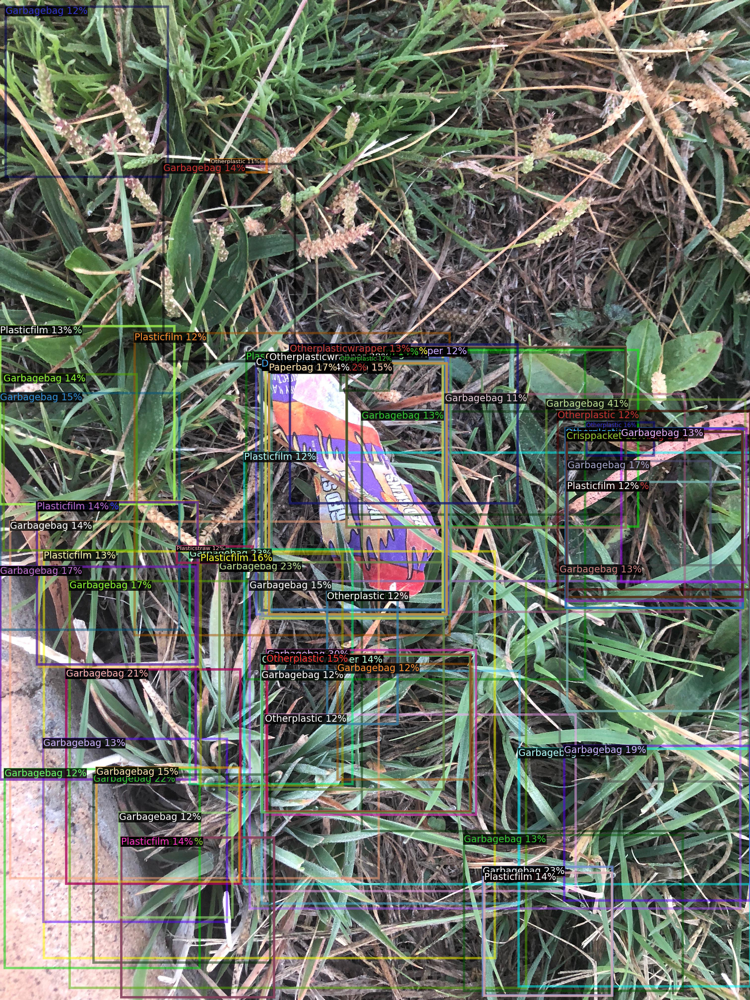

In [15]:
# visualize random predictions on test set
dataset_dicts = my_dataset_function("test")
metadata_test = MetadataCatalog.get('tronTACO_test')

d = random.sample(dataset_dicts, 1)[0]   
im = cv2.imread(d["file_name"])
outputs = predictor(im) 
v = Visualizer(im[:, :, ::-1],metadata=metadata_test,scale=0.5)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

In [15]:
# A lot of *false positive* detections. RetinaNet may not be appropriate...
# TODO & NEXT STEPS: Data augmentation; stratified train/test split